# SF Crime Classification

### Description

In the data set provided by Kaggle, there is a 12 year span of crimes. I would like to create a density map of all crimes committed per year. By doing this, I want to see which district has the highest crime rate per year. If they are all around the same area, maybe there is a reasoning behind this? In addition, I would like to create a frequency graph for each district that plot out the number of crimes throughout each hour of the day. With this, we would get an idea of whether or not most crimes occur during the day or at night. Using both the density maps and the frequency graphs, I want to rank all the districts in San Francisco on a scale of most dangerous to safest locations to live at and best times to be around San Francisco.

In [1]:
# Import all the necessary Python libraries for data visualization
% matplotlib inline

import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
import csv
from datetime import datetime

In [2]:
# File path of where the data is located
file_path = '~/info490-fa17-honors/data/train.csv'

# Read the .csv file stored at the file path
crimes = pd.read_csv(file_path)

In [3]:
# Display the first 5 entries as an example of what the Pandas DataFrame looks like
crimes.head(5)

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [4]:
# Display the last 5 entries
crimes.tail(5)

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
878044,2003-01-06 00:15:00,ROBBERY,ROBBERY ON THE STREET WITH A GUN,Monday,TARAVAL,NONE,FARALLONES ST / CAPITOL AV,-122.459033,37.714056
878045,2003-01-06 00:01:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,INGLESIDE,NONE,600 Block of EDNA ST,-122.447364,37.731948
878046,2003-01-06 00:01:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,SOUTHERN,NONE,5TH ST / FOLSOM ST,-122.403390,37.780266
878047,2003-01-06 00:01:00,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Monday,SOUTHERN,NONE,TOWNSEND ST / 2ND ST,-122.390531,37.780607
878048,2003-01-06 00:01:00,FORGERY/COUNTERFEITING,"CHECKS, FORGERY (FELONY)",Monday,BAYVIEW,NONE,1800 Block of NEWCOMB AV,-122.394926,37.738212


In [5]:
# Replace the Dates column with the column as Date objects
crimes['Dates'] = pd.to_datetime(crimes['Dates'])

In [6]:
# List of all the districts, crime categories throughout all the entries
districts = sorted(crimes['PdDistrict'].unique())
categories = sorted(crimes['Category'].unique())

# List of all the years, months, hours, and days throughout all the entries
years = sorted(crimes['Dates'].dt.year.unique())
months = sorted(crimes['Dates'].dt.month.unique())
hours = sorted(crimes['Dates'].dt.hour.unique())
days = sorted(crimes['DayOfWeek'].unique())

## Number of Crimes per District, Category, and Time

### District

PdDistrict
SOUTHERN      157182
MISSION       119908
NORTHERN      105296
BAYVIEW        89431
CENTRAL        85460
TENDERLOIN     81809
INGLESIDE      78845
TARAVAL        65596
PARK           49313
RICHMOND       45209
dtype: int64


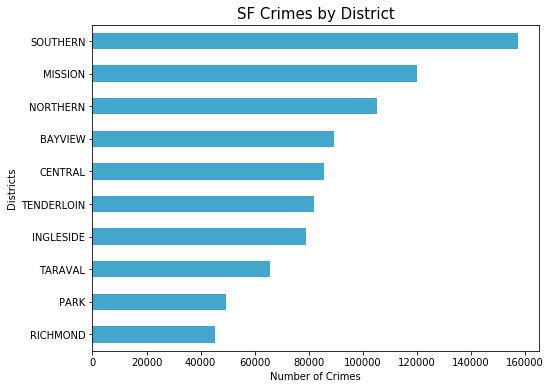

In [7]:
# Obtain all the districts and the number of crimes that took place in that district
district_total = crimes.groupby('PdDistrict').size().sort_values(ascending=True)
print(district_total.sort_values(ascending=False))

# Choose a color palette from seaborn to graph the data in district_total
colors = sns.color_palette('GnBu_d', 1).as_hex()

# Plot a bar graph between the districts and total counts in descending order
district_total.plot(kind='barh', figsize=(8,6), color=colors)

# Add title, x-label, and y-label
plt.xlabel('Number of Crimes')
plt.ylabel('Districts')
plt.title('SF Crimes by District', fontsize=15)

# Show the plot
plt.show()

From this bar graph, I would say there are about three different levels of crimes committed in a district. Southern, Mission, and Northern districts clearly have a lot more crimes committed than the rest of the districts. Next, I would say Bayview, Central, Tenderloin, and Ingleside are close and it is hard to determine between these 4, which district is more dangerous than the others. Lastly, I would rank Taraval, Park, and Richmond as the safest of all the district in San Francisco because they have significantly lower number of crimes.

### Type of Crime

Category
LARCENY/THEFT                  174900
OTHER OFFENSES                 126182
NON-CRIMINAL                    92304
ASSAULT                         76876
DRUG/NARCOTIC                   53971
VEHICLE THEFT                   53781
VANDALISM                       44725
WARRANTS                        42214
BURGLARY                        36755
SUSPICIOUS OCC                  31414
MISSING PERSON                  25989
ROBBERY                         23000
FRAUD                           16679
FORGERY/COUNTERFEITING          10609
SECONDARY CODES                  9985
WEAPON LAWS                      8555
PROSTITUTION                     7484
TRESPASS                         7326
STOLEN PROPERTY                  4540
SEX OFFENSES FORCIBLE            4388
DISORDERLY CONDUCT               4320
DRUNKENNESS                      4280
RECOVERED VEHICLE                3138
KIDNAPPING                       2341
DRIVING UNDER THE INFLUENCE      2268
RUNAWAY                          1946
LIQ

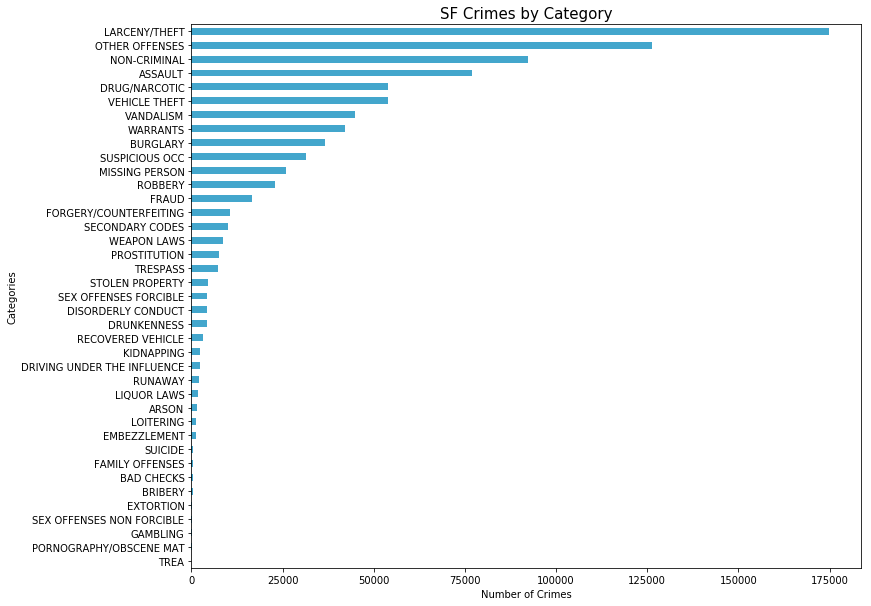

In [8]:
# Obtain all the crime categories and the number of crimes that were committed by that type of crime
category_total = crimes.groupby('Category').size().sort_values(ascending=True)
print(category_total.sort_values(ascending=False))

# Get the top 10 crime categories by extracting the last 10 crimes in a sorted DataFrame
top_10_crimes = category_total.index.values[29:]

# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('GnBu_d', 1).as_hex()

# Plot a bar graph between the crime categories and total counts in descending order
category_total.plot(kind='barh', figsize=(12, 10), color=colors)

# Add title, x-label, and y-label
plt.xlabel('Number of Crimes')
plt.ylabel('Categories')
plt.title('SF Crimes by Category', fontsize=15)

# Show the plot
plt.show()

Because there are so many different types of crimes possible, I would say the biggest crimes that visitors should be aware of when living or visiting San Francisco are the top 4, since there are significantly more than the rest. These crimes are theft, other offenses, non-criminal, and assault.

### Year

Total in 2003: 73902
Total in 2004: 73422
Total in 2005: 70779
Total in 2006: 69909
Total in 2007: 68015
Total in 2008: 70174
Total in 2009: 69000
Total in 2010: 66542
Total in 2011: 66619
Total in 2012: 71731
Total in 2013: 75606
Total in 2014: 74766
Total in 2015: 27584


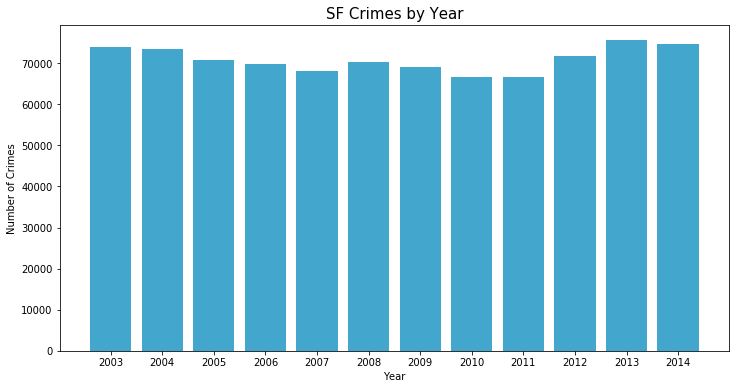

In [9]:
# Obtain every year except 2015 and the number of crimes that were committed in that year
year_total = []
year_no_2015 = years[0:12]
for i in range(len(years)):
    year_total.append(len(crimes[crimes['Dates'].dt.year == years[i]].index))
    print('Total in ' + str(years[i]) + ': ' + str(year_total[i]))

# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('GnBu_d', 1).as_hex()

# Plot a bar graph between the year (without 2015) and total counts in descending order
plt.figure(figsize=(12,6))
plt.bar(year_no_2015, year_total[:-1], color=colors)

# Add title, x-label, and y-label
plt.xticks(year_no_2015)
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.title('SF Crimes by Year', fontsize=15)

# Show the plot
plt.show()

Based on this graph, it is hard to make a conclusion about the number of crimes per year because although there is a slight dip in crimes committed from 2008 to 2011, that value increases over the next 3 years. This is not enough to say there is a clear increase or decrease in crimes over the years.

### Month

Total in January: 73536
Total in February: 70813
Total in March: 76320
Total in April: 78096
Total in May: 79644
Total in June: 70892
Total in July: 69971
Total in August: 68540
Total in September: 71982
Total in October: 80274
Total in November: 72975
Total in December: 65006


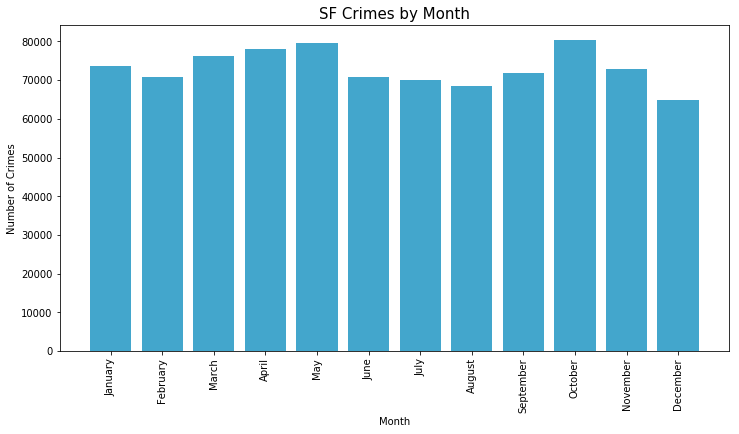

In [10]:
# Use this dictionary to overwrite the label of each bar with the actual month name
month_dict = {1: 'January', 2: 'February', 3: 'March', 4: 'April', 5: 'May', 6: 'June', 7: 'July', 8: 'August', 9: 'September', 10: 'October', 11: 'November', 12: 'December'}

# Obtain every month and the number of crimes that were committed in that month
month_total = []
for i in range(len(months)):
    month_total.append(len(crimes[crimes['Dates'].dt.month == months[i]].index))
    print('Total in ' + month_dict[months[i]] + ': ' + str(month_total[i]))

# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('GnBu_d', 1).as_hex()

# Plot a bar graph between the month and total counts in descending order
plt.figure(figsize=(12,6))
plt.bar(months, month_total, color=colors)

# Add title, x-label, and y-label
plt.xticks(months, month_dict.values(), rotation=90)
plt.xlabel('Month')
plt.ylabel('Number of Crimes')
plt.title('SF Crimes by Month', fontsize=15)

# Show the plot
plt.show()

I think from this graph, it is pretty interesting to see a consistent lower number of crimes during the summer (June, July, and August) as well as December. It makes me wonder if the season plays a factor in whether or not more or less crimes are being committed.

### Day of the Week

DayOfWeek
Friday       133734
Wednesday    129211
Saturday     126810
Thursday     125038
Tuesday      124965
Monday       121584
Sunday       116707
dtype: int64


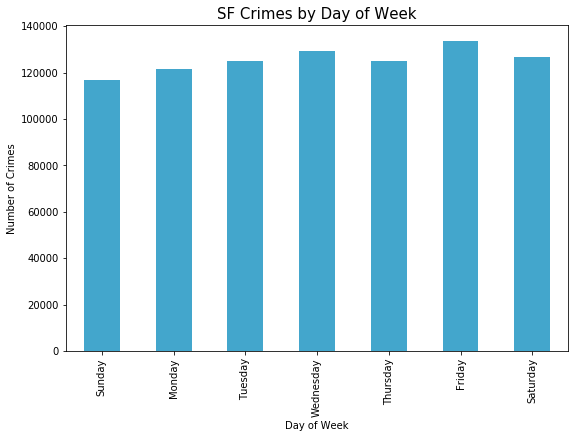

In [11]:
day_of_week = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

# Obtain every day of the week and the number of crimes that were committed in day
days_total = crimes.groupby('DayOfWeek').size().sort_values(ascending=True)
print(days_total.sort_values(ascending=False))

# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('GnBu_d', 1).as_hex()

# Plot a bar graph between each day of the week and total counts in descending order
# Also, reorder the days of week in terms of how it is in real life, Sunday through Saturday
days_total = days_total[day_of_week]
days_total.plot(kind='bar', figsize=(9,6), color=colors)

# Add title, x-label, and y-label
plt.xlabel('Day of Week')
plt.ylabel('Number of Crimes')
plt.title('SF Crimes by Day of Week', fontsize=15)

# Show the plot
plt.show()

Based on this graph, I was surprised to see that not as many crimes were committed on Sunday. Initially, I would think that most people visit San Francisco over the weekends and would play a factor in having more crimes committed; however, from the results, Sunday is the day with the complete opposite of having the most number of crimes committed.

## Area Plot: Top 10 Crimes Committed

### Crime Categories per District  Throughout the Day

In [12]:
# Extract only 3 columns from the crimes DataFrame: dates (for hour), crime category, and district
hour_per_district_total = crimes[['Dates', 'Category', 'PdDistrict']]

# Keep only the crimes that fall under the top 10 crimes based on the bar graph between crimes and count
hour_per_district_total = hour_per_district_total[hour_per_district_total['Category'].isin(top_10_crimes)]

# Extract only the hour value and rename the column to "Hour"
hour_per_district_total = hour_per_district_total.rename(columns={'Dates':'Hour', 'PdDistrict':'District'})

# Get the number of crimes in each district at a given hour for each of the top 10 crime categories
hour_per_district_total = hour_per_district_total.groupby(['District', hour_per_district_total['Hour'].dt.hour, 'Category']).size().reset_index(name='Count')

# Display the first 5 entries as an example of what the new DataFrame looks like
hour_per_district_total.head()

,District,Hour,Category,Count
0,BAYVIEW,0,ASSAULT,437
1,BAYVIEW,0,BURGLARY,111
2,BAYVIEW,0,DRUG/NARCOTIC,125
3,BAYVIEW,0,LARCENY/THEFT,441
4,BAYVIEW,0,NON-CRIMINAL,282


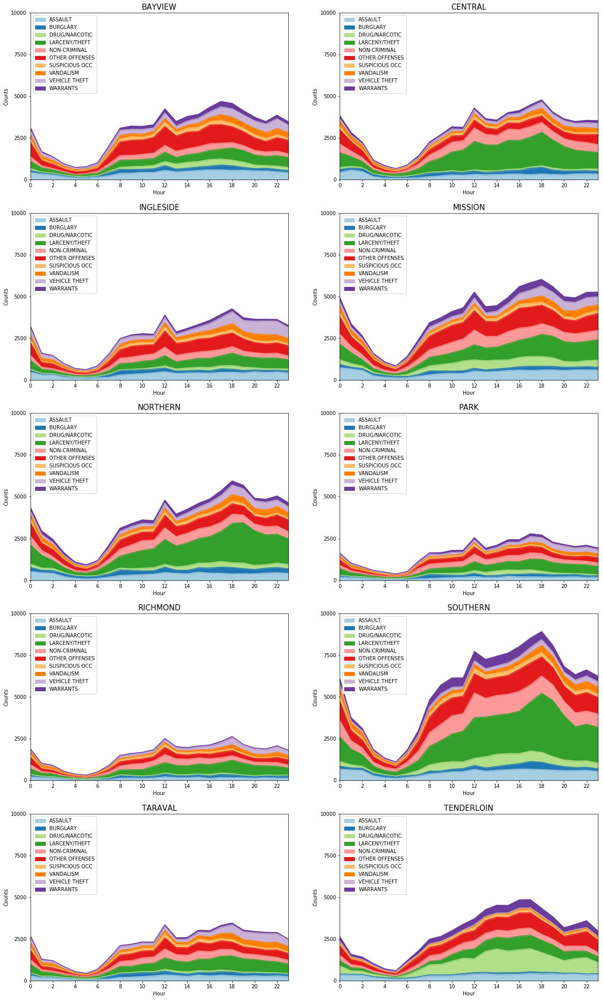

In [13]:
# Create a 10 subplots for each of the 10 districts
fig, ax = plt.subplots(5, 2, figsize=(20,35))

# Create a counter that will iterate through the unique districts list
count = 0

# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('Paired', 10).as_hex()

# For each subplot, for each district...
for row in range(5):
    for col in range(2):
        # Set the title, x-label, and y-label
        ax[row, col].set_title(districts[count], fontsize=15)
        ax[row, col].set_xlabel('Time')
        ax[row, col].set_ylabel('Counts')
        
        # Set the x-limit, y-limit, and where the tick marks are at
        ax[row, col].set_xlim(0, 23)
        ax[row, col].set_ylim(0, 10000)
        ax[row, col].set_xticks(np.arange(0, 24, 2))
        ax[row, col].set_yticks(np.arange(0, 12500, 2500))
        
        # Only take the counts when the district is i.e. "Bayview" when graphing for the "Bayview" subplot
        df = hour_per_district_total[hour_per_district_total['District'] == districts[count]]
        # Create a new pivot table that only stores the hour, crime category, and the count (drop the district column)
        df = df.pivot(index='Hour', columns='Category', values='Count')
        # Plot an area graph
        df.plot.area(ax=ax[row, col], color=colors)
        
        # Display the legend where each color represents a crime
        ax[row, col].legend(loc='upper left')

        # Increment counter
        count += 1

# Show the plot
plt.show()

I really wanted to create an area plot because it helps me better understand what time and what kind of crimes increase throughout the day. Just a side note, I made all the x-limit and y-limit the same for each of the subplots so that we can see which districts have signicantly more crimes than others and that way it is all scaled the same. There are several observations I would like to make. In all of the graphs, it seems like most crimes are not committed in the early morning around 4 to 6 AM. There is a clear dip in all of the subplots. Also, the top crime committed, theft, clearly increases from morning to night with a peak in the afternoon in most graphs, but significantly in 3 districts: Southern, Northern, and Central which are all locations near popular attractions (Fisherman's Wharf, Pier 39, AT&T Park, Chinatown, SF Museum of Modern Art, Palace of Fine Arts). Lastly, I thought it was pretty interesting to see that Tenderloin is the only district where drug and narcotic had the most crimes committed compared to all the other top 10 crimes in at that given district. It would be interesting to look into why more drugs are committed in Tenderloin.

### 10-in-1

In [14]:
# Extract only 2 columns from the crimes DataFrame: dates (for hour), crime category
hour_category_total = crimes[['Dates', 'Category']]

# Keep only the crimes that fall under the top 10 crimes based on the bar graph between crimes and count
hour_category_total = hour_category_total[hour_category_total['Category'].isin(top_10_crimes)]

# Extract only the hour value and rename the column to "Hour"
hour_category_total = hour_category_total.rename(columns={'Dates':'Hour'})

# Get the number of crimes at a given hour for each of the top 10 crime categories
hour_category_total = hour_category_total.groupby([hour_category_total['Hour'].dt.hour, 'Category']).size().reset_index(name='Count')

# Create a pivot table that will help with graphing in the next cell
hour_category_total = hour_category_total.pivot_table(index='Hour', columns='Category', values='Count')

# Display what the new DataFrame looks like
hour_category_total

Category,ASSAULT,BURGLARY,DRUG/NARCOTIC,LARCENY/THEFT,NON-CRIMINAL,OTHER OFFENSES,SUSPICIOUS OCC,VANDALISM,VEHICLE THEFT,WARRANTS
Hour,,,,,,,,,,
0,4291,1365,1703,7019,4305,7375,2033,2681,2035,1680
1,3789,832,1043,4304,2292,3630,844,1832,1392,1205
2,3454,879,808,2957,1789,3057,793,1819,1116,977
3,1738,865,546,1786,1240,2003,553,1107,669,694
4,1052,772,379,1098,941,1516,366,711,505,567
5,825,707,205,1130,861,1166,287,579,498,399
6,1034,805,600,1806,1541,1692,468,661,741,715
7,1580,1272,1313,2930,2758,3459,793,932,1268,1337
8,2573,2124,1733,4952,3886,5264,1409,1395,2002,1591


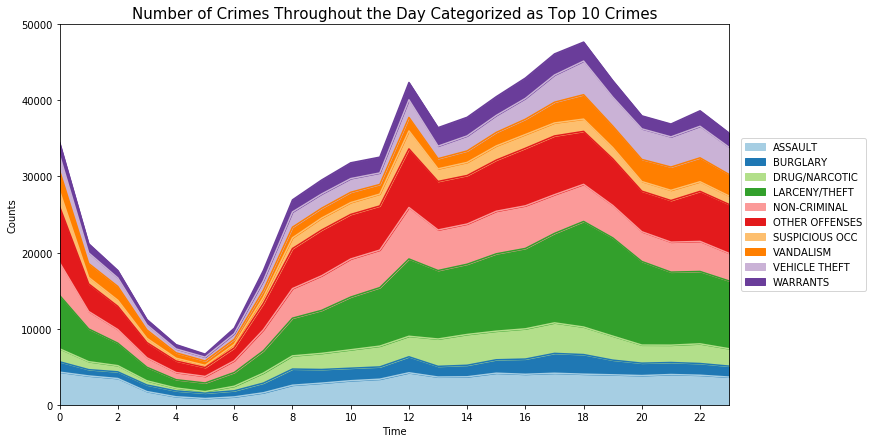

In [15]:
# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('Paired', 10).as_hex()

# Create a subplot with a given figure size
fig, ax = plt.subplots(figsize=(12, 7))

# Using the previously generated DataFrame, plot an area graph with all the district data are combined
hour_category_total.plot.area(ax=ax, color=colors)

# Set the title, x-label, and y-label
ax.set_title('Number of Crimes Throughout the Day Categorized as Top 10 Crimes', fontsize=15)
ax.set_xlabel('Time')
ax.set_ylabel('Counts')

# Set the x-limit, y-limit, and where the tick marks are at
ax.set_xlim(0, 23)
ax.set_ylim(0, 50000)
ax.set_xticks(np.arange(0, 24, 2))
ax.set_yticks(np.arange(0, 60000, 10000))

# Display the legend where each color represents a crime
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')

# Show the plot
plt.show()

This graph is just a combined graph of the 10 subplots where the districts weren't a factor. I just wanted to see a general comparison between the number of crimes for each of the top 10 crimes committed throughout the day. Clearly, we see theft and other offenses with with the highest crime counts. It is also interesting to see how the number of crimes dip significantly in the morning and steadily increases throughout the day with some peaks at noon and 6 PM.

### Crime Categories per District  Throughout the Year

In [16]:
# Extract only 3 columns from the crimes DataFrame: dates (for year), crime category, and district
year_per_district_total = crimes[['Dates', 'Category', 'PdDistrict']]

# Keep only the crimes that fall under the top 10 crimes
year_per_district_total = year_per_district_total[year_per_district_total['Category'].isin(top_10_crimes)]

# Extract only the hour value and rename the column to "Year"
year_per_district_total = year_per_district_total.rename(columns={'Dates':'Year', 'PdDistrict':'District'})

# Count based on the iteration of a month cycle, so we need to set that as the index
year_per_district_total = year_per_district_total.reset_index().set_index('Year')

# Get the number of crimes in each district in a month for each of the top 10 crime categories
year_per_district_total = year_per_district_total.groupby(['District', pd.TimeGrouper('M'), 'Category'])['Category'].size().reset_index(name='Count')

# Display the first 5 entries as an example of what the new DataFrame looks like
year_per_district_total.head()

,District,Year,Category,Count
0,BAYVIEW,2003-01-31,ASSAULT,73
1,BAYVIEW,2003-01-31,BURGLARY,34
2,BAYVIEW,2003-01-31,DRUG/NARCOTIC,52
3,BAYVIEW,2003-01-31,LARCENY/THEFT,62
4,BAYVIEW,2003-01-31,NON-CRIMINAL,37


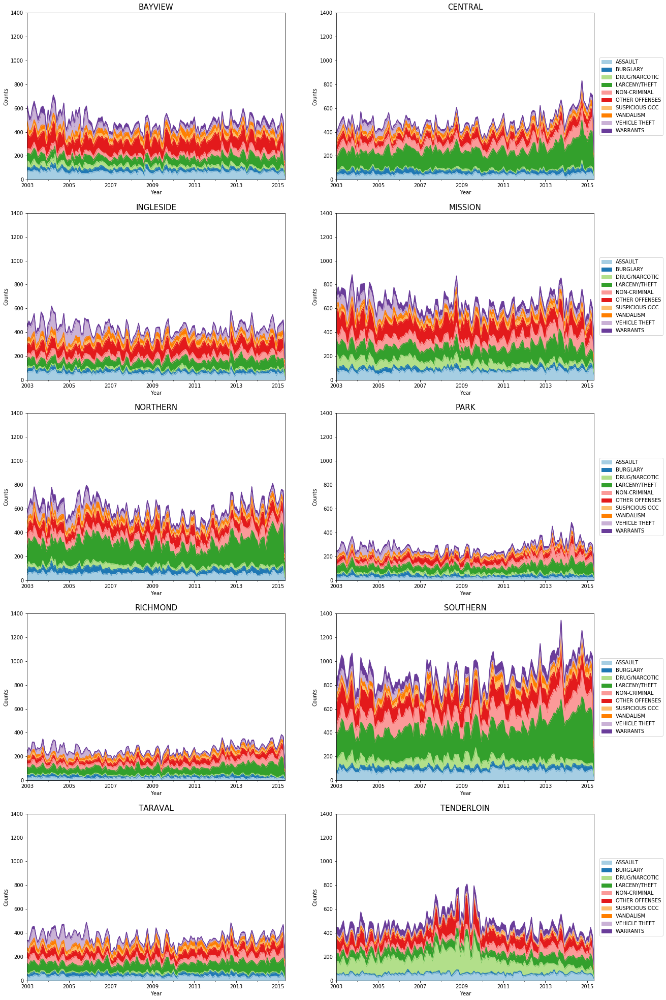

In [17]:
# Create a 10 subplots for each of the 10 districts
fig, ax = plt.subplots(5, 2, figsize=(20,35))

# Create a counter that will iterate through the unique districts list
count = 0

# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('Paired', 10).as_hex()

# For each subplot, for each district...
for row in range(5):
    for col in range(2):
        # Set the title, x-label, and y-label
        ax[row, col].set_title(districts[count], fontsize=15)
        ax[row, col].set_xlabel('Year')
        ax[row, col].set_ylabel('Counts')
        
        # Set the y-limit and where the tick marks are at
        ax[row, col].set_ylim(0, 1400)
        ax[row, col].set_yticks(np.arange(0, 1600, 200))
        
        # Only take the counts when the district is i.e. "Bayview" when graphing for the "Bayview" subplot
        df = year_per_district_total[year_per_district_total['District'] == districts[count]]
        # Create a new pivot table that only stores the year, crime category, and the count (drop the district column)
        df = df.pivot(index='Year', columns='Category', values='Count')
        # Plot an area graph
        df.plot.area(ax=ax[row, col], color=colors)
        
        # Display the legend where each color represents a crime
        if col == 1:
            ax[row, col].legend(loc='center left', bbox_to_anchor=(1.01, 0.5))
        else:
            ax[row, col].legend().set_visible(False)

        # Increment counter
        count += 1

# Show the plot
plt.show()

In each of these 10 subplots, I plotted the number of crimes committed per month throughout the whole span of the data. It is a little hard to really analyze each of the graph, but some key observations include that throughout the years, in most of the districts aside from Southern, Northern, and Central, the number of crimes for each of the categories is about the same. It is specifically for those 3 districts where theft is significantly higher, which made me wonder if the increase in theft in the those 3 districts made theft the most committed crime. Also, another interesting observation is that Tenderloin has an interesting peak of crimes throughout the span of 208 to 2010, specifically in drugs. As mentioned earlier, it makes me wonder if there was a specific event that happened that caused there to be higher crime counts in drugs during that time period.

### 10-in-1

In [18]:
# Extract only 2 columns from the crimes DataFrame: dates (for year), crime category
year_category_total = crimes[['Dates', 'Category']]

# Keep only the crimes that fall under the top 10 crimes based on the bar graph between crimes and count
year_category_total = year_category_total[year_category_total['Category'].isin(top_10_crimes)]

# Extract only the hour value and rename the column to "Year"
year_category_total = year_category_total.rename(columns={'Dates':'Year'})

# Count based on the iteration of a month cycle, so we need to set that as the index
year_category_total = year_category_total.reset_index().set_index('Year')

# Get the number of crimes at a given month for each of the top 10 crime categories
year_category_total = year_category_total.groupby([pd.TimeGrouper('M'), 'Category'])['Category'].size().reset_index(name='Count')

# Create a pivot table that will help with graphing in the next cell
year_category_total = year_category_total.pivot_table(index='Year', columns='Category', values='Count')

# Display what the new DataFrame looks like
year_category_total

Category,ASSAULT,BURGLARY,DRUG/NARCOTIC,LARCENY/THEFT,NON-CRIMINAL,OTHER OFFENSES,SUSPICIOUS OCC,VANDALISM,VEHICLE THEFT,WARRANTS
Year,,,,,,,,,,
2003-01-31,507,223,455,962,455,966,162,258,515,418
2003-02-28,490,231,505,1038,478,952,181,241,553,389
2003-03-31,579,270,287,1125,580,863,164,295,665,332
2003-04-30,545,303,476,1226,605,826,163,320,765,396
2003-05-31,636,305,467,1191,674,948,221,304,748,420
2003-06-30,536,206,380,1143,549,877,189,302,571,367
2003-07-31,484,211,321,988,478,749,156,242,607,372
2003-08-31,478,238,380,1030,559,791,174,259,623,392
2003-09-30,620,219,447,1136,580,966,203,250,753,419


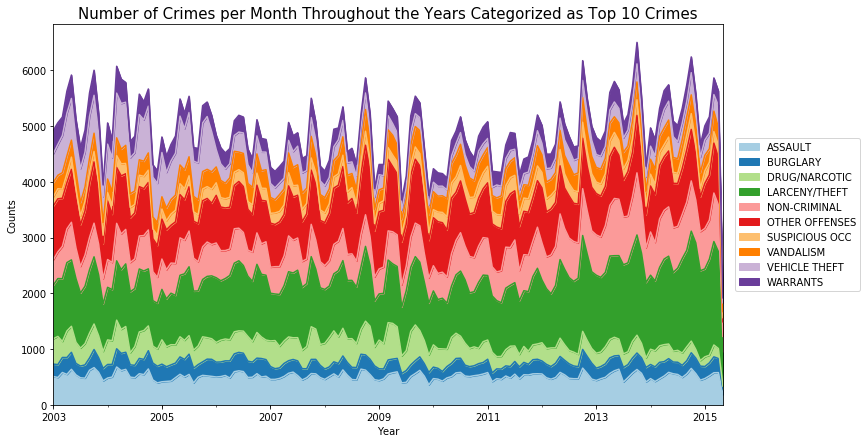

In [19]:
# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('Paired', 10).as_hex()

# Create a subplot with a given figure size
fig, ax = plt.subplots(figsize=(12, 7))

# Using the previously generated DataFrame, plot an area graph with all the district data are combined
year_category_total.plot.area(ax=ax, color=colors)

# Set the title, x-label, and y-label
ax.set_title('Number of Crimes per Month Throughout the Years Categorized as Top 10 Crimes', fontsize=15)
ax.set_xlabel('Year')
ax.set_ylabel('Counts')

# Display the legend where each color represents a crime
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')

# Show the plot
plt.show()

Again, this graph is just a combined graph of the 10 subplots where the districts weren't a factor. It is interesting to say that the number of crimes committed from 2003 to 2015 is still peak of about 6000 in a given month. I would also say each of the crimes consistently have roughly the same amount throughout the year. When the number of crimes peak or dip for a given month, it peaks and dips for all crimes.

## Frequency Plot: All Crime Counts by Time

### Hour by District

In [20]:
# Extract only 2 columns from the crimes DataFrame: dates (for hour), district
hour_district_total = crimes[['Dates', 'PdDistrict']]

# Extract only the hour value and rename the column to "Hour"
hour_district_total = hour_district_total.rename(columns={'Dates':'Hour', 'PdDistrict':'District'})

# Get the number of crimes at a given hour for each of districts
hour_district_total = hour_district_total.groupby([hour_district_total['Hour'].dt.hour, 'District']).size().reset_index(name='Count')

# Create a pivot table that will help with graphing in the next cell
hour_district_total = hour_district_total.pivot(index='Hour', columns='District', values='Count')

# Display what the new DataFrame looks like
hour_district_total

District,BAYVIEW,CENTRAL,INGLESIDE,MISSION,NORTHERN,PARK,RICHMOND,SOUTHERN,TARAVAL,TENDERLOIN
Hour,,,,,,,,,,
0,4041,4983,4256,6659,5639,2119,2507,7977,3459,3225
1,2092,3509,1944,4403,3703,1246,1249,4532,1551,1944
2,1714,2806,1814,3627,3192,1011,1107,3796,1451,1778
3,1196,1506,1200,2114,2148,697,666,2236,1006,1245
4,928,1081,870,1447,1397,591,443,1591,645,870
5,976,854,777,1128,1295,438,396,1322,512,939
6,1301,1083,1087,1893,1546,629,594,2194,855,1951
7,2701,1649,2041,3043,2443,1362,1056,3598,1798,2357
8,3954,2664,3136,4194,3679,2100,1808,5678,2754,2933


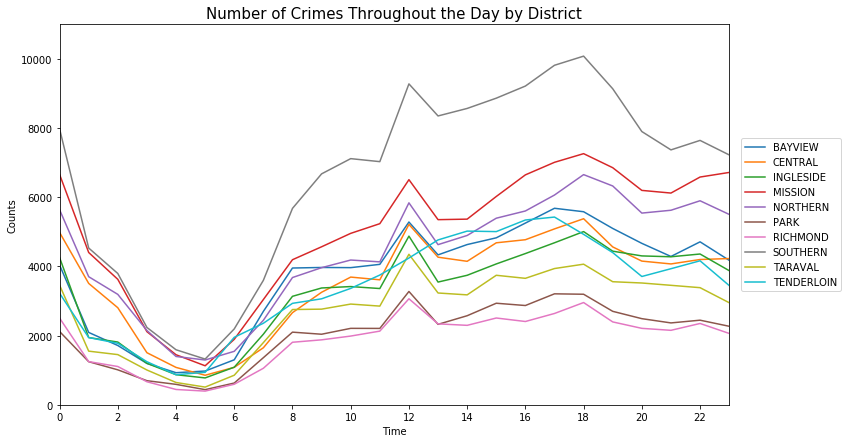

In [21]:
# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('tab10', 10).as_hex()

# Create a subplot with a given figure size
fig, ax = plt.subplots(figsize=(12, 7))

# Using the previously generated DataFrame, plot line graphs overlapping with each other
hour_district_total.plot(ax=ax, color=colors)

# Set the title, x-label, and y-label
ax.set_title('Number of Crimes Throughout the Day by District', fontsize=15)
ax.set_xlabel('Time')
ax.set_ylabel('Counts')

# Set the x-limit, y-limit, and where the tick marks will go
ax.set_xlim(0, 23)
ax.set_ylim(0, 11000)
ax.set_xticks(np.arange(0, 24, 2))
ax.set_yticks(np.arange(0, 12000, 2000))

# Display the legend where each color represents a district
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')

# Show the plot
plt.show()

In this plot, we can see that Southern significantly has a lot more crimes than the rest of the districts from about 8 AM to 8 PM. Additionally, all the districts all peak at noon, whereas I thought it was interesting that Tenderloin was the only district that didn't peak.

### Hour by Category

In [22]:
# Extract only 2 columns from the crimes DataFrame: dates (for hour), crime category
hour_category_total = crimes[['Dates', 'Category']]

# Keep only the crimes that fall under the top 10 crimes based on the bar graph between crimes and count
hour_category_total = hour_category_total[hour_category_total['Category'].isin(top_10_crimes)]

# Extract only the hour value and rename the column to "Hour"
hour_category_total = hour_category_total.rename(columns={'Dates':'Hour'})

# Get the number of crimes at a given hour for each of crimes
hour_category_total = hour_category_total.groupby([hour_category_total['Hour'].dt.hour, 'Category']).size().reset_index(name='Count')

# Create a pivot table that will help with graphing in the next cell
hour_category_total = hour_category_total.pivot(index='Hour', columns='Category', values='Count')

# Display what the new DataFrame looks like
hour_category_total

Category,ASSAULT,BURGLARY,DRUG/NARCOTIC,LARCENY/THEFT,NON-CRIMINAL,OTHER OFFENSES,SUSPICIOUS OCC,VANDALISM,VEHICLE THEFT,WARRANTS
Hour,,,,,,,,,,
0,4291,1365,1703,7019,4305,7375,2033,2681,2035,1680
1,3789,832,1043,4304,2292,3630,844,1832,1392,1205
2,3454,879,808,2957,1789,3057,793,1819,1116,977
3,1738,865,546,1786,1240,2003,553,1107,669,694
4,1052,772,379,1098,941,1516,366,711,505,567
5,825,707,205,1130,861,1166,287,579,498,399
6,1034,805,600,1806,1541,1692,468,661,741,715
7,1580,1272,1313,2930,2758,3459,793,932,1268,1337
8,2573,2124,1733,4952,3886,5264,1409,1395,2002,1591


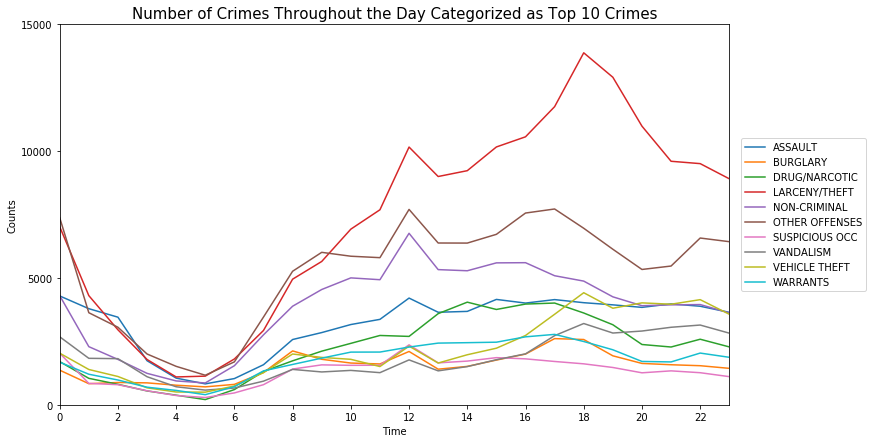

In [23]:
# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('tab10', 10).as_hex()

# Create a subplot with a given figure size
fig, ax = plt.subplots(figsize=(12, 7))

# Using the previously generated DataFrame, plot line graphs overlapping with each other
hour_category_total.plot(ax=ax, color=colors)

# Set the title, x-label, and y-label
ax.set_title('Number of Crimes Throughout the Day Categorized as Top 10 Crimes', fontsize=15)
ax.set_xlabel('Time')
ax.set_ylabel('Counts')

# Set the x-limit, y-limit, and where the tick marks will go
ax.set_xlim(0, 23)
ax.set_ylim(0, 15000)
ax.set_xticks(np.arange(0, 24, 2))
ax.set_yticks(np.arange(0, 20000, 5000))

# Display the legend where each color represents a crime
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')

# Show the plot
plt.show()

In this plot, we see a clear difference between theft and all the other crimes from about noon to midnight. If we just looked at the morning from 12 AM to about 6 AM, we don't really see a significant difference between the number of crimes committed per category.

### Month by District

In [24]:
# Extract only 2 columns from the crimes DataFrame: dates (for month), district
month_district_total = crimes[['Dates', 'PdDistrict']]

# Extract only the month value and rename the column to "Month"
month_district_total = month_district_total.rename(columns={'Dates':'Month', 'PdDistrict':'District'})

# Get the number of crimes in a given month for each of districts
month_district_total = month_district_total.groupby([month_district_total['Month'].dt.month, 'District']).size().reset_index(name='Count')

# Create a pivot table that will help with graphing in the next cell
month_district_total = month_district_total.pivot(index='Month', columns='District', values='Count')

# Display what the new DataFrame looks like
month_district_total

District,BAYVIEW,CENTRAL,INGLESIDE,MISSION,NORTHERN,PARK,RICHMOND,SOUTHERN,TARAVAL,TENDERLOIN
Month,,,,,,,,,,
1,7808,7020,6647,10153,8763,4122,3781,12885,5461,6896
2,7336,6824,6541,9980,8506,3765,3658,12378,5149,6676
3,7882,7206,6967,10436,9291,4236,3924,13463,5746,7169
4,7806,7524,7172,10512,9305,4673,4188,13706,6025,7185
5,8230,7503,7120,10732,9441,4623,4155,14212,6068,7560
6,7257,7018,6234,9661,8464,3952,3575,13125,5229,6377
7,7053,7195,6135,9552,8401,3757,3579,12889,4944,6466
8,6776,6730,5881,9394,8093,3881,3573,12861,4865,6486
9,7229,6911,6325,9962,8429,4096,3621,13091,5420,6898


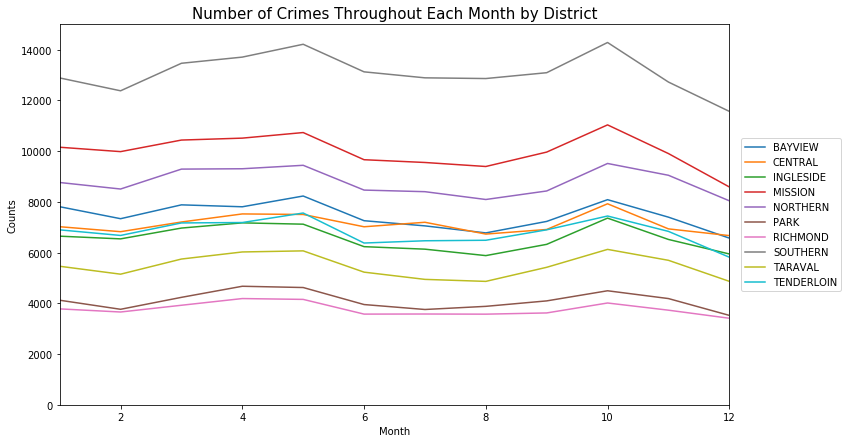

In [25]:
# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('tab10', 10).as_hex()

# Create a subplot with a given figure size
fig, ax = plt.subplots(figsize=(12, 7))

# Using the previously generated DataFrame, plot line graphs overlapping with each other
month_district_total.plot(ax=ax, color=colors)

# Set the title, x-label, y-label, and y-limit
ax.set_title('Number of Crimes Throughout Each Month by District', fontsize=15)
ax.set_xlabel('Month')
ax.set_ylabel('Counts')
ax.set_ylim(0, 15000)

# Display the legend where each color represents a district
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')

# Show the plot
plt.show()

In this plot, the results is similar to what I mentioned before where during the months of the summer (June, July, August), there is a little dip in number of crimes committed (same as October to December). Also, I think it is interesting to see that for each district, the number of crimes committed follow the same trend where it peaks and dips together.

### Month by Category

In [26]:
# Extract only 2 columns from the crimes DataFrame: dates (for month), crime category
month_category_total = crimes[['Dates', 'Category']]

# Keep only the crimes that fall under the top 10 crimes based on the bar graph between crimes and count
month_category_total = month_category_total[month_category_total['Category'].isin(top_10_crimes)]

# Extract only the month value and rename the column to "Month"
month_category_total = month_category_total.rename(columns={'Dates':'Month'})

# Get the number of crimes at a given hour for each of the top 10 crimes
month_category_total = month_category_total.groupby([month_category_total['Month'].dt.month, 'Category']).size().reset_index(name='Count')

# Create a pivot table that will help with graphing in the next cell
month_category_total = month_category_total.pivot(index='Month', columns='Category', values='Count')

# Display what the new DataFrame looks like
month_category_total

Category,ASSAULT,BURGLARY,DRUG/NARCOTIC,LARCENY/THEFT,NON-CRIMINAL,OTHER OFFENSES,SUSPICIOUS OCC,VANDALISM,VEHICLE THEFT,WARRANTS
Month,,,,,,,,,,
1,6226,3041,4906,14172,7470,11393,2580,3590,4255,3828
2,6104,2832,4862,13813,7117,10853,2485,3409,4030,3728
3,6680,3201,4937,14748,8104,11486,2651,3889,4457,3833
4,6793,3336,4761,15257,8297,11351,2766,4090,4828,3822
5,7175,3281,4903,15201,8685,11460,2932,4013,4720,3764
6,6434,2881,4037,14178,7551,9846,2609,3680,4299,3353
7,6050,3040,4044,14450,7506,9699,2445,3679,4399,3287
8,5747,2792,4296,14248,7176,9703,2402,3469,4430,3366
9,6474,2769,4536,14500,7614,10177,2639,3601,4572,3407


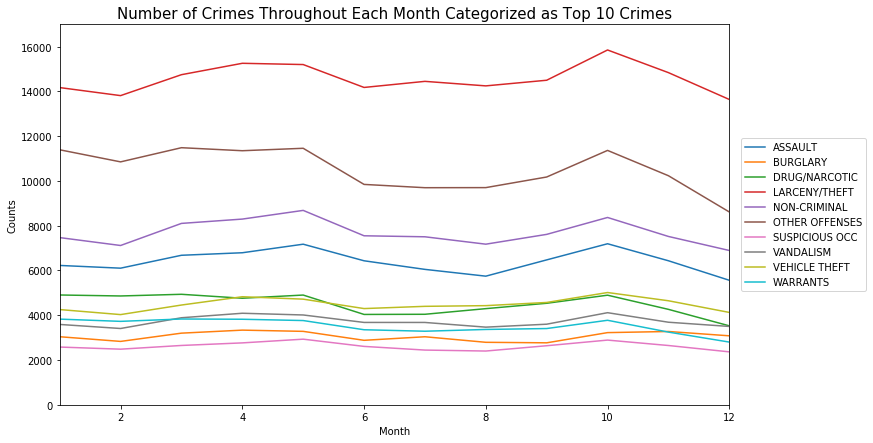

In [27]:
# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('tab10', 10).as_hex()

# Create a subplot with a given figure size
fig, ax = plt.subplots(figsize=(12, 7))

# Using the previously generated DataFrame, plot line graphs overlapping with each other
month_category_total.plot(ax=ax, color=colors)

# Set the title, x-label, y-label, and y-limit
ax.set_title('Number of Crimes Throughout Each Month Categorized as Top 10 Crimes', fontsize=15)
ax.set_xlabel('Month')
ax.set_ylabel('Counts')
ax.set_ylim(0, 17000)

# Display the legend where each color represents a crime
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')

# Show the plot
plt.show()

I would say this graph has similar observations as the one before. All the line graphs follow a similar trend.

### Year by District

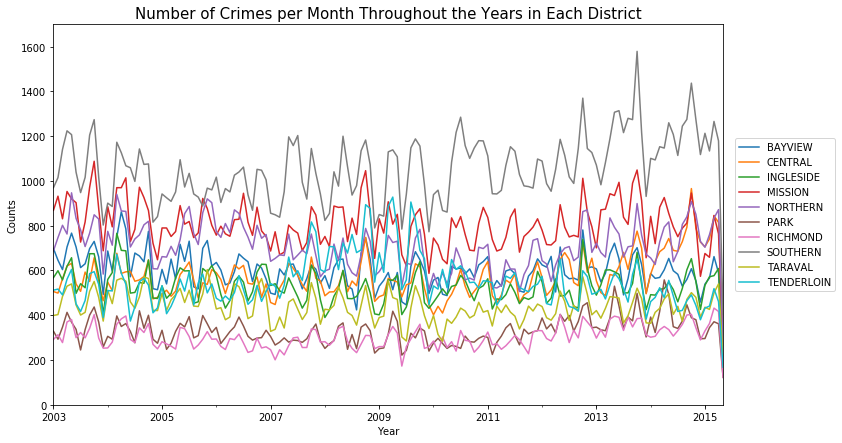

In [28]:
# Extract only 2 columns from the crimes DataFrame: dates (for year), district
year_district_total = crimes[['Dates', 'PdDistrict']]

# Extract only the year value and rename the column to "Year"
year_district_total = year_district_total.rename(columns={'Dates':'Year', 'PdDistrict':'District'})

# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('tab10', 10).as_hex()

# Create a subplot with a given figure size
fig, ax = plt.subplots(figsize=(12,7))

# Create a counter that will iterate through the unique districts list
count = 0

# For each district...
for loc in districts:
    # Only take the counts when the district is i.e. "Bayview" when graphing for the "Bayview" subplot
    df = year_district_total[year_district_total['District'] == loc].reset_index().set_index('Year')
    # Regenerate counts based on per month
    df = df['District'].resample('M').count()
    # Plot a line graph
    df.plot(kind='line', ax=ax, label=loc, color=colors[count])
    # Increment counter
    count += 1

# Set the title, x-label, y-label, and y-limit
ax.set_title('Number of Crimes per Month Throughout the Years in Each District', fontsize=15)
ax.set_xlabel('Year')
ax.set_ylabel('Counts')
ax.set_ylim(0, 1700)

# Display the legend where each color represents a district
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')

# Show the plot
plt.show()

The main observation I would like to make about this plot is that Southern District has a lot more crimes than the other districts from 2011-2015.

In [29]:
# Get the number of crimes at a given year for each of the districts
year_district_total = year_district_total.groupby([year_district_total['Year'].dt.year, 'District']).size().reset_index(name='Count')

# Create a pivot table that will help with graphing in the next cell
year_district_total = year_district_total.pivot(index='Year', columns='District', values='Count')

# Display what the new DataFrame looks like
year_district_total

District,BAYVIEW,CENTRAL,INGLESIDE,MISSION,NORTHERN,PARK,RICHMOND,SOUTHERN,TARAVAL,TENDERLOIN
Year,,,,,,,,,,
2003,7950,6679,6895,10577,9298,4135,3852,12859,5528,6129
2004,8044,6795,6984,10283,9202,4044,3795,12161,5990,6124
2005,7545,6550,6617,9738,9338,3982,3485,11515,5865,6144
2006,7234,6734,6460,9659,9371,3865,3267,11878,5538,5903
2007,6870,6626,6233,9027,8080,3558,3249,12087,4934,7351
2008,7033,6681,5843,9963,7870,3611,3438,12058,5214,8463
2009,6734,6419,6015,9325,7900,3609,3431,12044,5061,8462
2010,6970,6008,6177,9040,7270,3350,3286,12978,4647,6816
2011,6891,6432,5948,9248,7346,3710,3411,12359,4912,6362


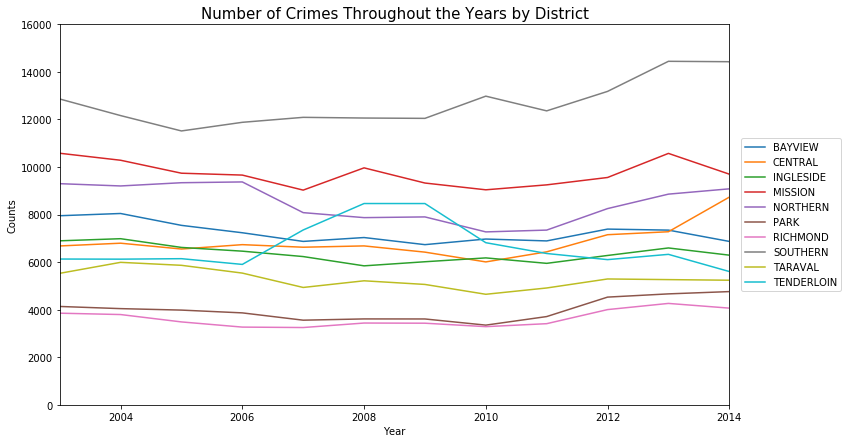

In [30]:
# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('tab10', 10).as_hex()

# Create a subplot with a given figure size
fig, ax = plt.subplots(figsize=(12, 7))

# Using the previously generated DataFrame, plot line graphs overlapping with each other
year_district_total.plot(ax=ax, color=colors)

# Set the title, x-label, and y-label
ax.set_title('Number of Crimes Throughout the Years by District', fontsize=15)
ax.set_xlabel('Year')
ax.set_ylabel('Counts')

# Set the x-limit and y-limit
ax.set_xlim(2003, 2014)
ax.set_ylim(0, 16000)

# Display the legend where each color represents a district
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')

# Show the plot
plt.show()

I think it is interesting to see that Tenderloin is the only district that makes a significant peak from 2006 to 2010. It is probably related to the peak in drugs from our previous graphs.

### Year by Category

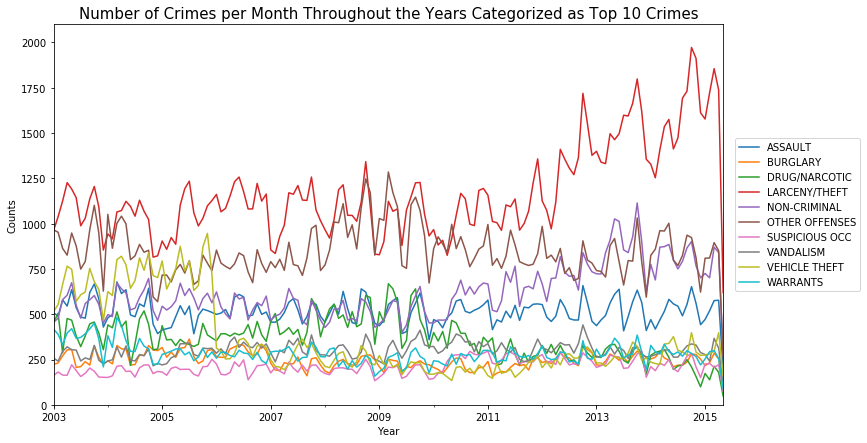

In [31]:
# Extract only 2 columns from the crimes DataFrame: dates (for year), crime category
year_category_total = crimes[['Dates', 'Category']]

# Keep only the crimes that fall under the top 10 crimes based on the bar graph between crimes and count
year_category_total = year_category_total[year_category_total['Category'].isin(top_10_crimes)]

# Extract only the year value and rename the column to "Year"
year_category_total = year_category_total.rename(columns={'Dates':'Year'})

# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('tab10', 10).as_hex()

# Create a subplot with a given figure size
fig, ax = plt.subplots(figsize=(12,7))

# Create a counter that will iterate through the unique districts list
count = 0

# For each top 10 crimes...
for crime in sorted(top_10_crimes):
    # Only take the counts when the crime one of the top 10 crimes
    df = year_category_total[year_category_total['Category'] == crime].reset_index().set_index('Year')
    # Regenerate counts based on per month
    df = df['Category'].resample('M').count()
    # Plot a line graph
    df.plot(kind='line', ax=ax, label=crime, color=colors[count])
    # Increment counter
    count += 1

# Set the title, x-label, y-label, and y-limit
ax.set_title('Number of Crimes per Month Throughout the Years Categorized as Top 10 Crimes', fontsize=15)
ax.set_xlabel('Year')
ax.set_ylabel('Counts')
ax.set_ylim(0, 2100)

# Display the legend where each color represents a crime
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')

# Show the plot
plt.show()

It seems like theft is the number 1 crime on the watch if someone were to visit or live in San Francisco today. We can clearly see an increase in theft over the last 4 years compared to all the other crimes. Also there was a point in 2009 where other offenses was actually the crime that was most committed in a given month.

In [32]:
# Get the number of crimes at a given year for each of the top 10 crimes
year_category_total = year_category_total.groupby([year_category_total['Year'].dt.year, 'Category']).size().reset_index(name='Count')

# Create a pivot table that will help with graphing in the next cell
year_category_total = year_category_total.pivot(index='Year', columns='Category', values='Count')

# Display what the new DataFrame looks like
year_category_total

Category,ASSAULT,BURGLARY,DRUG/NARCOTIC,LARCENY/THEFT,NON-CRIMINAL,OTHER OFFENSES,SUSPICIOUS OCC,VANDALISM,VEHICLE THEFT,WARRANTS
Year,,,,,,,,,,
2003,6555,3017,4875,12990,6566,10614,2103,3271,7583,4527
2004,6467,3330,4873,12111,6882,10324,2263,3187,8758,4006
2005,5779,3463,4379,12402,6976,8848,2341,3473,9111,3414
2006,6364,3550,4700,13798,6635,9363,2404,3890,3700,3255
2007,6105,2655,5219,12760,6273,9759,2389,3693,3250,3486
2008,6327,2800,5866,12800,6021,11860,2319,3576,2983,2902
2009,5976,2633,5951,12538,6185,12044,2213,3777,2603,2893
2010,6128,2491,4489,12214,6937,10464,2957,4008,2197,3065
2011,6117,2515,3374,13084,7673,9938,3049,3570,2361,3257


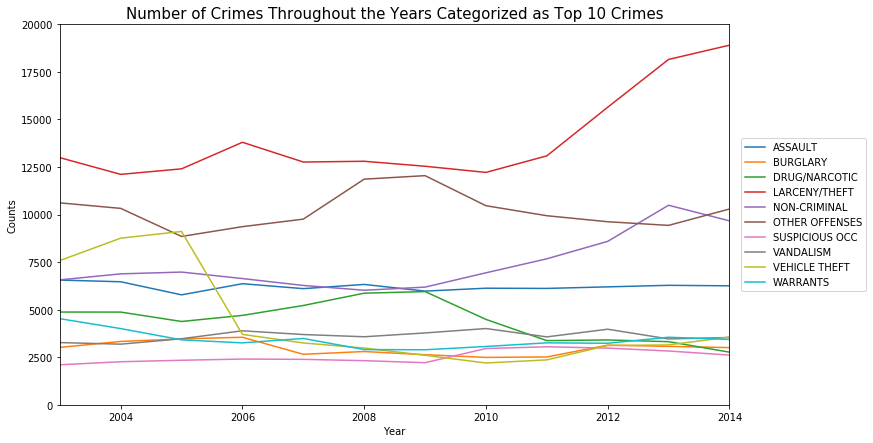

In [33]:
# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('tab10', 10).as_hex()

# Create a subplot with a given figure size
fig, ax = plt.subplots(figsize=(12, 7))

# Using the previously generated DataFrame, plot line graphs overlapping with each other
year_category_total.plot(ax=ax, color=colors)

# Set the title, x-label, and y-label
ax.set_title('Number of Crimes Throughout the Years Categorized as Top 10 Crimes', fontsize=15)
ax.set_xlabel('Year')
ax.set_ylabel('Counts')

# Set the x-limit and y-limit
ax.set_xlim(2003, 2014)
ax.set_ylim(0, 20000)

# Display the legend where each color represents a crime
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')

# Show the plot
plt.show()

The first thing I think of when I see this plot is, vehicle theft signicantly drop ever since 2006. Was there some event that caused the number of vehicle theft crimes to drop for good? Are cars being built so it is hard to be stolen?

## Bar Plot: Comparing Crime Patterns

### Month per Year

In [34]:
# Extract the Dates columns from the crimes DataFrame
year_month_total = crimes[['Dates']]

# Rename the column to "Year"
year_month_total = year_month_total.rename(columns={'Dates':'Year'})

# Create a new column and rename the column to "Month"
temp = year_month_total.rename(columns={'Dates':'Month'})

# Add the column to new DataFrame
year_month_total['Month'] = temp

# Get the number of crimes at in a given year and month
year_month_total = year_month_total.groupby([year_month_total['Year'].dt.year, year_month_total['Month'].dt.month]).size().reset_index(name='Count')

# Create a pivot table that will help with graphing in the next cell
year_month_total = year_month_total.pivot(index='Year', columns='Month', values='Count')

# Drop columns with na specifically for 2015
year_month_total = year_month_total.dropna()

# Display what the new DataFrame looks like
year_month_total

Month,1,2,3,4,5,6,7,8,9,10,11,12
Year,,,,,,,,,,,,
2003,5831.0,5964.0,6099.0,6758.0,7025.0,6052.0,5503.0,5800.0,6704.0,7259.0,6194.0,4713.0
2004,5938.0,5626.0,7262.0,6988.0,6865.0,5614.0,5679.0,6439.0,6361.0,6695.0,5011.0,4944.0
2005,5669.0,5252.0,5448.0,5586.0,6426.0,6134.0,6512.0,5428.0,5426.0,6292.0,6422.0,6184.0
2006,5896.0,5537.0,5418.0,5524.0,6177.0,6393.0,6246.0,5523.0,5312.0,6183.0,5868.0,5832.0
2007,5094.0,5093.0,5209.0,5336.0,6253.0,5984.0,5894.0,5331.0,5509.0,6733.0,6253.0,5326.0
2008,5182.0,5284.0,5974.0,6028.0,6597.0,5556.0,5631.0,5275.0,6367.0,7173.0,6371.0,4736.0
2009,5272.0,5237.0,6580.0,6472.0,6355.0,4543.0,4960.0,6199.0,6671.0,6593.0,5581.0,4537.0
2010,5179.0,5063.0,4997.0,4890.0,5708.0,5888.0,6207.0,5758.0,5453.0,5395.0,5906.0,6098.0
2011,6130.0,5029.0,5071.0,5123.0,5742.0,5915.0,5895.0,5056.0,5278.0,5410.0,5761.0,6209.0


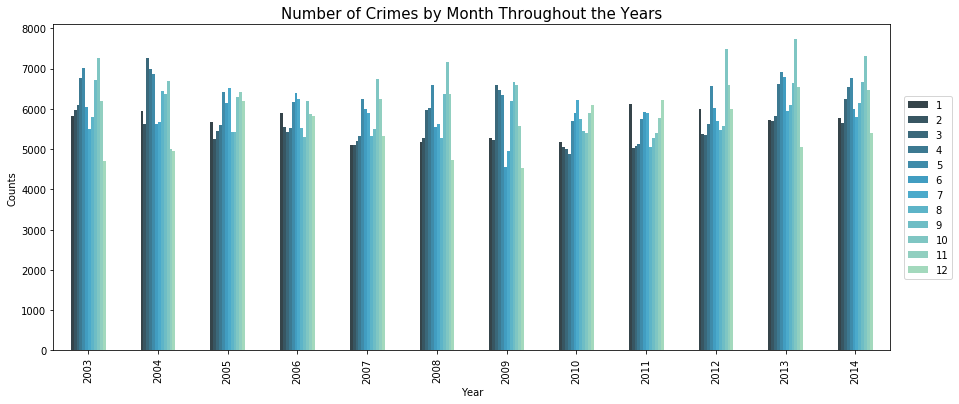

In [35]:
# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('GnBu_d', 12).as_hex()

# Create a subplot with a given figure size
fig, ax = plt.subplots(figsize=(15,6))

# Using the previously generated DataFrame, plot bar graphs of each crime counts in each month grouped by year
year_month_total.plot.bar(ax=ax, color=colors)

# Set the title, x-label, y-label, and y-limit
ax.set_title('Number of Crimes by Month Throughout the Years', fontsize=15)
ax.set_xlabel('Year')
ax.set_ylabel('Counts')
ax.set_ylim(0, 8100)

# Display the legend where each color represents a month
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')

# Show the plot
plt.show()

I think over the last 3 years, it is interesting to see that October was the month with the most number of crimes committed. There is also a dip for number of crimes committed every year around June and July.

### Day of Week per Month

In [36]:
day_of_week = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

# Extract only 2 columns from the crimes DataFrame: Dates (month), days of the week
month_day_total = crimes[['Dates', 'DayOfWeek']]

# Get the number of crimes at in a given month and day of the week
month_day_total = month_day_total.groupby([month_day_total['Dates'].dt.month, 'DayOfWeek']).size().reset_index(name='Count').rename(columns={'Dates':'Month'})
# Reorder days of the week to be how it is on a calendar so Sunday through Saturday
month_day_total['DayOfWeek'] = month_day_total['DayOfWeek'].astype('category', categories=day_of_week)
# Create a pivot table that will help with graphing in the next cell
month_day_total = month_day_total.pivot(index='Month', columns='DayOfWeek', values='Count')

# Display what the new DataFrame looks like
month_day_total

DayOfWeek,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday
Month,,,,,,,
1,10577,9949,10097,10810,10371,10808,10924
2,9190,9781,10274,10592,9933,11022,10021
3,9420,12298,11618,11188,10451,11027,10318
4,9358,10931,11871,12443,11542,11325,10626
5,10165,10596,11369,11605,11719,12443,11747
6,10407,8818,9694,10107,10466,10988,10412
7,10529,8854,9169,9598,9714,11152,10955
8,9318,10040,9714,9775,9547,10299,9847
9,9043,10894,11200,10557,10129,10425,9734


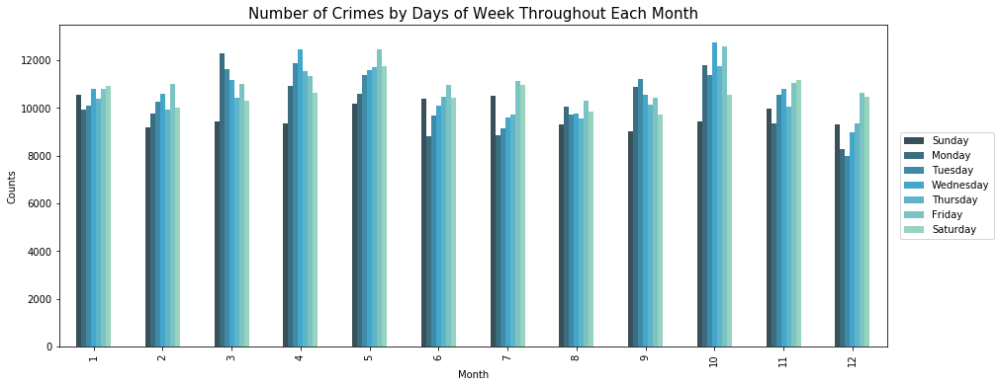

In [37]:
# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('GnBu_d', 7).as_hex()

# Create a subplot with a given figure size
fig, ax = plt.subplots(figsize=(15,6))

# Using the previously generated DataFrame, plot bar graphs of each crime counts in each day of the week grouped by month
month_day_total.plot.bar(ax=ax, color=colors)

# Set the title, x-label, y-label, and y-limit
ax.set_title('Number of Crimes by Days of Week Throughout Each Month', fontsize=15)
ax.set_xlabel('Month')
ax.set_ylabel('Counts')
ax.set_ylim(0, 13500)

# Display the legend where each color represents the days of the week
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')

# Show the plot
plt.show()

Although at the beginning, I said that Sunday was the day of the week with the least number of crimes committed, in June, July and December, it is interesting to see that Sunday was actually the day of the week with a lot of crimes committed.

### Seasons

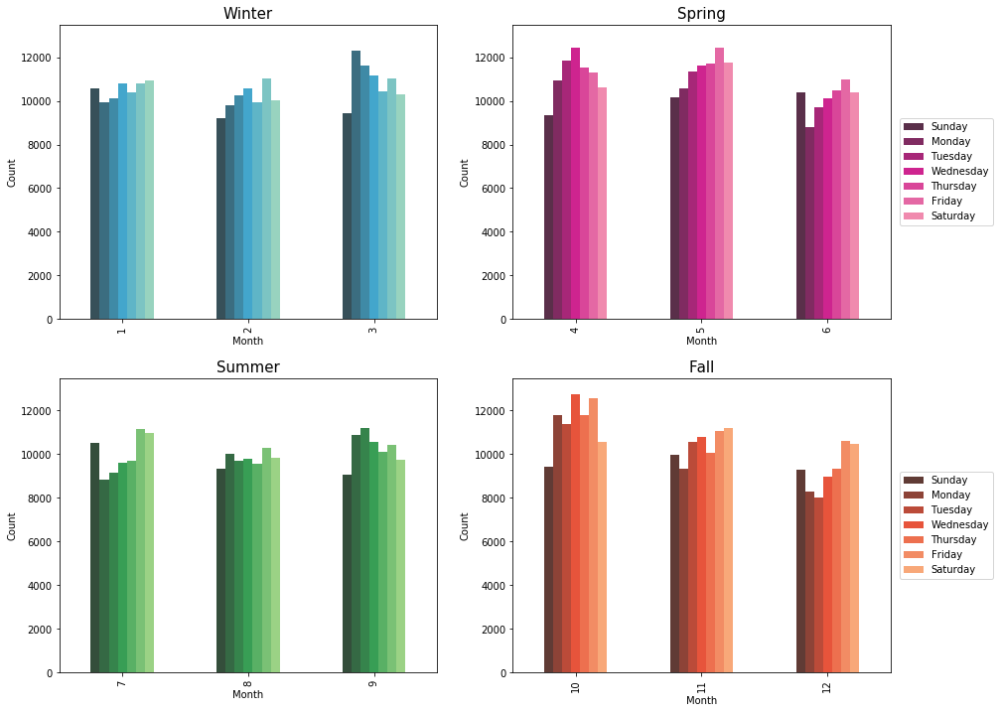

In [38]:
# Create a subplot for each of the 4 seasons
fig, ax = plt.subplots(2, 2, figsize=(15,12))

# List of season will be used for the title
seasons = ['Winter', 'Spring', 'Summer', 'Fall']
    
# Create a counter that will iterate through each of the 4 seasons
count = 0
# Create a counter that will iterate through 3 months at a time
month = 0

# For each subplot, for each season...
for row in range(2):
    for col in range(2):
        # Choose a color palette from seaborn to graph the data in category
        if row == 0 and col == 0:
            colors = sns.color_palette('GnBu_d', 7).as_hex()
        elif row == 0 and col == 1:
            colors = sns.color_palette('RdPu_d', 7).as_hex()
        elif row == 1 and col == 0:
            colors = sns.color_palette('YlGn_d', 7).as_hex()
        else:
            colors = sns.color_palette('OrRd_d', 7).as_hex()
        
        # Plot bar graphs of each crime counts in each day of the week grouped by month
        month_day_total.iloc[month:month+3].plot.bar(ax=ax[row, col], color=colors)
        
        # Set the title, x-label, y-label, and y-limit
        ax[row, col].set_title(seasons[count], fontsize=15)
        ax[row, col].set_xlabel('Month')
        ax[row, col].set_ylabel('Count')
        ax[row, col].set_ylim(0, 13500)
        
        # Display the legend where each color represents the days of the week
        if col == 0:
            ax[row, col].legend().set_visible(False)
        else:
            ax[row, col].legend(loc='center left', bbox_to_anchor=[1.01, 0.5])
            
        # Increment counters
        count += 1
        month += 3
        
# Show the plot
plt.show()

All these subplots have the same scaling and uses the same data as before, but I wanted to split it up and group into season. We can see that summer significantly has a lot less crimes that the rest of the season whereas I would say spring has the most.

### Time per Day of Week

In [39]:
day_of_week = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

# Extract only 2 columns from the crimes DataFrame: Dates (for hour), days of the week
day_hour_total = crimes[['Dates', 'DayOfWeek']]

# Get the number of crimes at in a given hour of the day and day of the week
day_hour_total = day_hour_total.groupby([day_hour_total['Dates'].dt.hour, 'DayOfWeek']).size().reset_index(name='Count').rename(columns={'Dates':'Hour'})

# Reorder days of the week to be how it is on a calendar so Sunday through Saturday
day_hour_total['DayOfWeek'] = day_hour_total['DayOfWeek'].astype('category', categories=day_of_week)

# Create a pivot table that will help with graphing in the next cell
day_hour_total = day_hour_total.pivot(index='DayOfWeek', columns='Hour', values='Count')

# Display what the new DataFrame looks like
day_hour_total

Hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
DayOfWeek,,,,,,,,,,,,,,,,,,,,,
Sunday,7778,5672,4713,2742,1733,1276,1645,2141,3208,3892,...,5678,5951,6510,6847,6684,5775,5808,5652,6091,5508
Monday,6070,3028,2585,1723,1335,1192,1989,3370,4891,5271,...,6309,6775,7046,7587,7819,6935,6049,5773,5750,5127
Tuesday,5773,2782,2461,1730,1319,1287,2080,3612,5254,5500,...,6435,7034,7236,7726,8109,7362,6376,6076,5988,5188
Wednesday,5603,2868,2377,1701,1268,1303,2054,3597,5596,5684,...,7076,7614,7813,8226,8401,7428,6599,6124,6258,5317
Thursday,5724,3150,2563,1690,1237,1229,1975,3434,5198,5532,...,6392,6970,7130,7625,7998,7413,6579,6309,6329,5748
Friday,6459,3429,2972,1831,1326,1187,1859,3499,5305,5564,...,6537,7320,7658,8382,8713,7785,6924,6991,7585,7507
Saturday,7458,5244,4625,2597,1645,1163,1531,2395,3448,4112,...,5997,6394,6744,7160,7380,6777,6359,6736,7740,8065


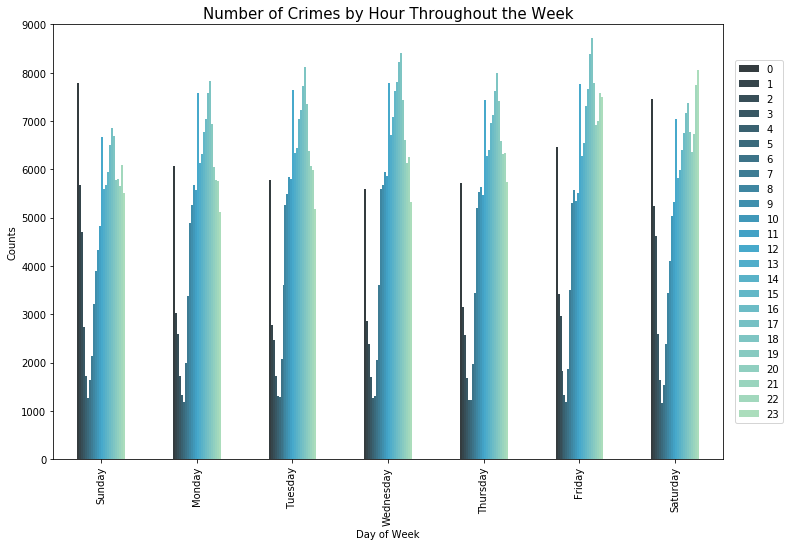

In [40]:
# Choose a color palette from seaborn to graph the data in category
colors = sns.color_palette('GnBu_d', 24).as_hex()

# Create a subplot with a given figure size
fig, ax = plt.subplots(figsize=(12,8))

# Using the previously generated DataFrame, plot bar graphs of each crime counts for each hour grouped by days of the week
day_hour_total.plot.bar(ax=ax, color=colors)

# Set the title, x-label, y-label, and y-limit
ax.set_title('Number of Crimes by Hour Throughout the Week', fontsize=15)
ax.set_xlabel('Day of Week')
ax.set_ylabel('Counts')
ax.set_ylim(0, 9000)

# Display the legend where each color represents the days of the week
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')

# Show the plot
plt.show()

It is interesting to see that in these bar plots, it follows some of the previous frequency graphs when comparing the number of crime counts throughout the day. We can clearly see a dip in the hour of about 2 AM to 6 AM. This is pretty consistent on each day of the week.

## Scatter Map: Top 10 Crimes by Location

### Year

In [41]:
# Extract only 4 columns from the crimes DataFrame: Dates (year), crime category, X, and Y
crime_year_geography = crimes[['Dates', 'Category', 'X', 'Y']].dropna()

# Remove outliers
crime_year_geography = crime_year_geography[crime_year_geography['Y'] != 90.000000]

In [42]:
# Display the first 5 entries as an example of what the new DataFrame looks like
crime_year_geography.head()

,Dates,Category,X,Y
0,2015-05-13 23:53:00,WARRANTS,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,-122.438738,37.771541


In [43]:
# Display the last 5 entries as an example of what the new DataFrame looks like
crime_year_geography.tail()

,Dates,Category,X,Y
878044,2003-01-06 00:15:00,ROBBERY,-122.459033,37.714056
878045,2003-01-06 00:01:00,LARCENY/THEFT,-122.447364,37.731948
878046,2003-01-06 00:01:00,LARCENY/THEFT,-122.403390,37.780266
878047,2003-01-06 00:01:00,VANDALISM,-122.390531,37.780607
878048,2003-01-06 00:01:00,FORGERY/COUNTERFEITING,-122.394926,37.738212


In [44]:
# Keep only the crimes that fall under the top 10 crimes based on the bar graph between crimes and count
top_10_map = crime_year_geography[crime_year_geography['Category'].isin(top_10_crimes)]

# Reverse the order for graphing purposes
top_crimes = top_10_crimes[::-1]

# Set the alpha levels (higher for plots plotted first)
alphas = [1.0, 0.9, 0.8, 0.7, 0.6, 0.5, 0.4, 0.3, 0.2, 0.1]

# Choose a color palette from seaborn to graph the data in district_total
colors = sns.color_palette('Pastel2', 10).as_hex()

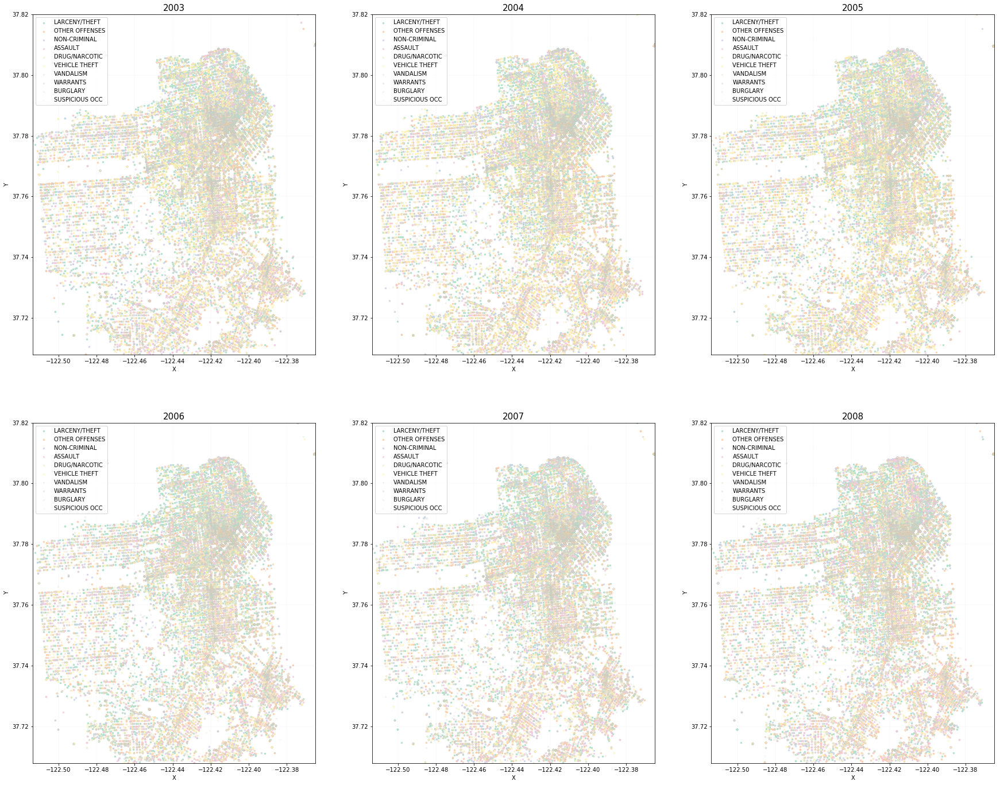

In [45]:
# Create a subplot for each of the 6 years
fig, ax = plt.subplots(2, 3, figsize=(30,24))

# List of the first half of the 12 years, so 2003 to 2008
year_first_half = years[0:6]

# Create a counter that will iterate through each year
year_count = 0

# For each subplot, for each year...
for row in range(2):
    for col in range(3):
        # Create a counter that will iterate through each crime category
        count = 0
        
        # For each top 10 crimes...
        for category in top_crimes:
            # Get the data where it is a given date and crime category
            crime = top_10_map[(top_10_map['Dates'].dt.year == year_first_half[year_count]) & (top_10_map['Category'] == category)]
            # For all those data, plot a point at the 'X' and 'Y' coordinate
            ax[row, col].scatter(crime['X'], crime['Y'], s=6, alpha=alphas[count], color=colors[count], label=category)
            # Increment counter
            count += 1

        # Set the title, x-label, and y-label
        ax[row, col].set_title(str(year_first_half[year_count]), fontsize=15)
        ax[row, col].set_xlabel('X')
        ax[row, col].set_ylabel('Y')

        # Set the x-limit and y-limit
        ax[row, col].set_xlim(-122.513642, -122.364937)
        ax[row, col].set_ylim(37.707879, 37.819975)
        
        # Display background grid and legend where each color represents a crime
        ax[row, col].grid(linestyle = '--', linewidth = 0.1)
        ax[row, col].legend(loc='upper left')

        # Increment counter
        year_count +=1

# Show the plot
plt.show()

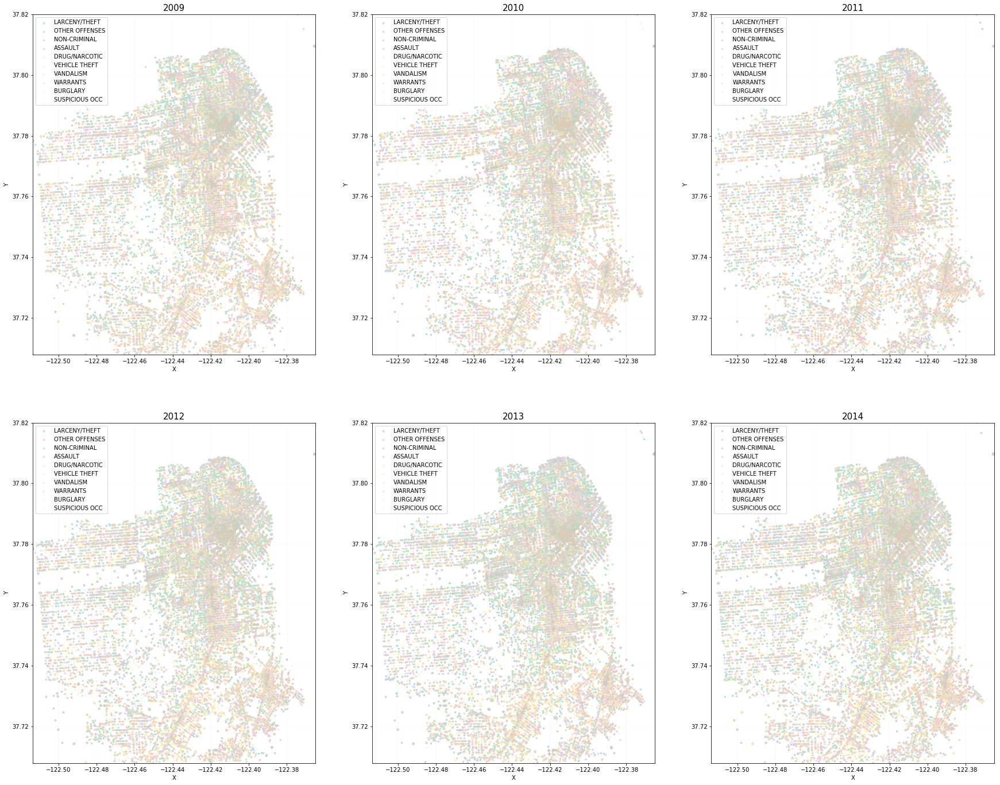

In [46]:
# Create a subplot for each of the 6 years
fig, ax = plt.subplots(2, 3, figsize=(30,24))

# List of the first half of the 12 years, so 2009 to 2014
year_second_half = years[6:12]

# Create a counter that will iterate through each year
year_count = 0

# For each subplot, for each year...
for row in range(2):
    for col in range(3):
        # Create a counter that will iterate through each crime category
        count = 0
        
        # For each top 10 crimes...
        for category in top_crimes:
            # Get the data where it is a given date and crime category
            crime = top_10_map[(top_10_map['Dates'].dt.year == year_second_half[year_count]) & (top_10_map['Category'] == category)]
            # For all those data, plot a point at the 'X' and 'Y' coordinate
            ax[row, col].scatter(crime['X'], crime['Y'], s=6, alpha=alphas[count], color=colors[count], label=category)
            # Increment counter
            count += 1

        # Set the title, x-label, and y-label
        ax[row, col].set_title(str(year_second_half[year_count]), fontsize=15)
        ax[row, col].set_xlabel('X')
        ax[row, col].set_ylabel('Y')

        # Set the x-limit and y-limit
        ax[row, col].set_xlim(-122.513642, -122.364937)
        ax[row, col].set_ylim(37.707879, 37.819975)
        
        # Display background grid and legend where each color represents a crime
        ax[row, col].grid(linestyle = '--', linewidth = 0.1)
        ax[row, col].legend(loc='upper left')

        # Increment counter
        year_count +=1

# Show the plot
plt.show()

First of all, I split up these graphs by 6 years because if the graphs were too small, it would be hard really see the data. Even how the graph is now, a user can barely see the differences throughout the years, which makes me wonder what were the a major differences in number of crimes and locations throughout each year. Each of these 12 subplots are very consistent in terms of where crimes were committed. One interesting observation is that the Golden Gate Park (the white rectangular strip in the middle left) in each year has very few crimes committed.

### 13-in-1

In [47]:
# Extract only 3 columns from the crimes DataFrame: crime category, X, Y
crime_geography = crimes[['Category', 'X', 'Y']].dropna()

# Remove outliers
crime_geography = crime_geography[crime_geography['Y'] != 90.000000]

In [48]:
# Display the first 5 entries as an example of what the new DataFrame looks like
crime_geography.head()

,Category,X,Y
0,WARRANTS,-122.425892,37.774599
1,OTHER OFFENSES,-122.425892,37.774599
2,OTHER OFFENSES,-122.424363,37.800414
3,LARCENY/THEFT,-122.426995,37.800873
4,LARCENY/THEFT,-122.438738,37.771541


In [49]:
# Display the last 5 entries as an example of what the new DataFrame looks like
crime_geography.tail()

,Category,X,Y
878044,ROBBERY,-122.459033,37.714056
878045,LARCENY/THEFT,-122.447364,37.731948
878046,LARCENY/THEFT,-122.403390,37.780266
878047,VANDALISM,-122.390531,37.780607
878048,FORGERY/COUNTERFEITING,-122.394926,37.738212


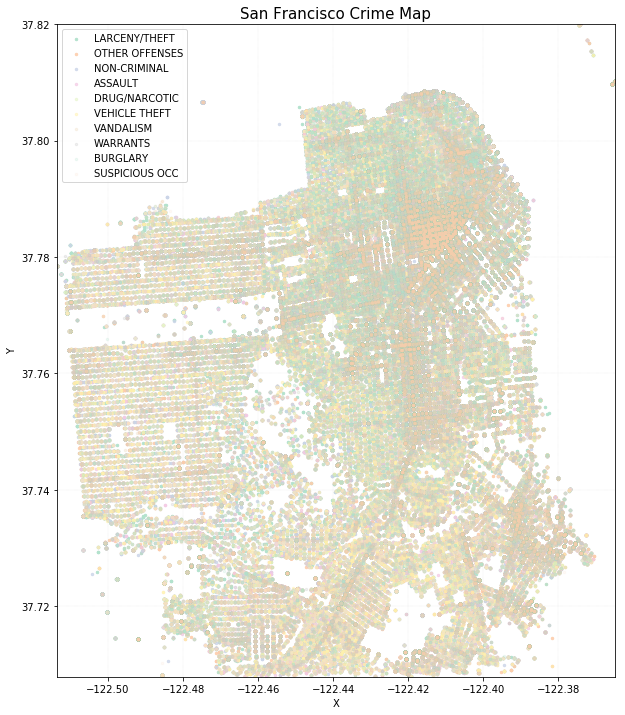

In [50]:
# Create a subplot with a given figure size
fig, ax = plt.subplots(figsize=(10, 12))

# Create a counter that will iterate through each crime category
count = 0

# For each top 10 crimes...
for category in top_crimes:
    # Get the data where it is a given crime category
    crime = top_10_map[(top_10_map['Category'] == category)]
    # For all those data, plot a point at the 'X' and 'Y' coordinate   
    ax.scatter(crime['X'], crime['Y'], s=6, alpha=alphas[count], color=colors[count], label=category)
    # Increment counter
    count += 1

# Set the title, x-label, and y-label
plt.title('San Francisco Crime Map', fontsize=15)
plt.xlabel('X')
plt.ylabel('Y')

# Set the x-limit and y-limit
plt.xlim(-122.513642, -122.364937)
plt.ylim(37.707879, 37.819975)

# Display background grid and legend where each color represents a crime
plt.legend(loc='upper left')
plt.grid(linestyle = '--', linewidth = 0.1)

# Show the plot
plt.show()

Lastly, I wanted to combine all the data together where we didn't care about which year the crime was committed. I think it is definitely interesting to see how the right side where the Southern, Northern, Central, and Mission districts are has a lot darker spot because of the number of crimes committed there are significantly higher. This may have to do with having a lot more attractions to do on the right side of the map whereas the left side has a lot more living properties.

## Major Conclusions

1. Theft has a significantly higher crime rate compared to other crime categories in the Southern, Northern, and Central districts.
2. Tenderloin had a period of time from 2006 to 2010 where there was a significant increase in crimes (mainly drugs).
3. June, July, August (summer), and December are the months with the least number of crimes.
4. Most crimes are committed on Friday and Saturday and around noon to midnight. 4 AM seems like the safest time to be in San Francisco.
5. The number of theft crimes committed is constantly increasing over the past 4 years.
6. Crime rates are higher in the districts where there is are popular attractions such as Fisherman's Wharf, Pier 39, Chinatown, and AT&T Center.